#**Question 1:**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from collections import Counter

In [ ]:
df=pd.read_csv('/content/glass.csv')
df

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0,1
...,...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0,7
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0,7
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0,7
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0,7


###preprocessing

In [ ]:
#we first check if there are any missing values in the dataset
print(df.isna().sum())

RI      0
Na      0
Mg      0
Al      0
Si      0
K       0
Ca      0
Ba      0
Fe      0
Type    0
dtype: int64


In [ ]:
#now we check the datatype of each attribute
print(df.dtypes)

RI      float64
Na      float64
Mg      float64
Al      float64
Si      float64
K       float64
Ca      float64
Ba      float64
Fe      float64
Type      int64
dtype: object


In [ ]:
#we check the distribution of each attribute using describe() method
print(df.describe())

               RI          Na          Mg          Al          Si           K  \
count  214.000000  214.000000  214.000000  214.000000  214.000000  214.000000   
mean     1.518365   13.407850    2.684533    1.444907   72.650935    0.497056   
std      0.003037    0.816604    1.442408    0.499270    0.774546    0.652192   
min      1.511150   10.730000    0.000000    0.290000   69.810000    0.000000   
25%      1.516522   12.907500    2.115000    1.190000   72.280000    0.122500   
50%      1.517680   13.300000    3.480000    1.360000   72.790000    0.555000   
75%      1.519157   13.825000    3.600000    1.630000   73.087500    0.610000   
max      1.533930   17.380000    4.490000    3.500000   75.410000    6.210000   

               Ca          Ba          Fe        Type  
count  214.000000  214.000000  214.000000  214.000000  
mean     8.956963    0.175047    0.057009    2.780374  
std      1.423153    0.497219    0.097439    2.103739  
min      5.430000    0.000000    0.000000    1

In [ ]:
#as in unsupervised learning we only don't take target/class attribute. Therefore we drop it from the dataset.
y_target=df['Type']
df=df.drop(['Type'], axis=1)
df

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0
...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0


In [ ]:
#now we do standardization of attributes so that all attributes can have equal impact on the computation of distances.

scaler = StandardScaler()
df.iloc[:,:]=scaler.fit_transform(df.iloc[:,:])
df

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
0,0.872868,0.284953,1.254639,-0.692442,-1.127082,-0.671705,-0.145766,-0.352877,-0.586451
1,-0.249333,0.591817,0.636168,-0.170460,0.102319,-0.026213,-0.793734,-0.352877,-0.586451
2,-0.721318,0.149933,0.601422,0.190912,0.438787,-0.164533,-0.828949,-0.352877,-0.586451
3,-0.232831,-0.242853,0.698710,-0.310994,-0.052974,0.112107,-0.519052,-0.352877,-0.586451
4,-0.312045,-0.169205,0.650066,-0.411375,0.555256,0.081369,-0.624699,-0.352877,-0.586451
...,...,...,...,...,...,...,...,...,...
209,-0.704815,0.898681,-1.865511,2.881125,-0.052974,-0.640968,0.157088,1.783978,-0.586451
210,-0.500178,1.856097,-1.865511,1.094342,0.529374,-0.763919,-0.392276,2.852405,-0.586451
211,0.754046,1.168721,-1.865511,1.154570,0.995252,-0.763919,-0.364103,2.953200,-0.586451
212,-0.612399,1.193270,-1.865511,0.993960,1.241133,-0.763919,-0.335931,2.812087,-0.586451


In [ ]:
import warnings
warnings.filterwarnings('ignore')

## a) Build a k-means clustering algorithm( can use sklearn library) and implement using the value of k which you find suitable. Visualize this part by showing the clusters along with the centroids.

In [ ]:
#buliding a k_means clustering algorithm
from sklearn.cluster import KMeans
k_means = KMeans(n_clusters=3, random_state=0) #we take the value of k as 3.
label =( k_means.fit_predict(df)) #predicting the value of class

In [ ]:
label

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2,
       0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2,
       2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 2, 1, 0, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2,
       0, 2, 0, 0, 0, 1, 1, 2, 1, 0, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

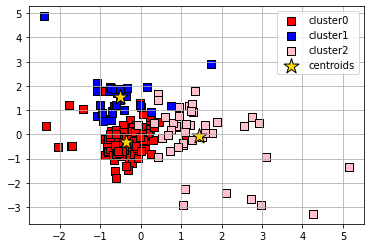

In [ ]:
# visualization by showing the clusters along with the centroids
colors=['red','blue','pink','green']
for i in range(0,3):
  plt.scatter(
      df[label == i].iloc[:, 0], df[label == i].iloc[:, 1],
      s=50, c=colors[i],
      marker='s', edgecolor='black',
      label='cluster'+str(i)
  )
plt.scatter(
    k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1],
    s=250, marker='*',
    c='gold', edgecolor='black',
    label='centroids'
)
plt.legend(scatterpoints=1)
plt.grid()
plt.show()

## b) Use different values of k and find the Silhouette score and then tell which value of k will be optimal and why?

silhouette_score for n_clusters= 2 is 0.41948052343085984
silhouette_score for n_clusters= 3 is 0.3671942443096343
silhouette_score for n_clusters= 4 is 0.3909627794318319
silhouette_score for n_clusters= 5 is 0.3332030725545686
silhouette_score for n_clusters= 6 is 0.3247494403575592
silhouette_score for n_clusters= 7 is 0.34373134578788256
silhouette_score for n_clusters= 8 is 0.3374672401824939
silhouette_score for n_clusters= 9 is 0.3607634576579404
silhouette_score for n_clusters= 10 is 0.34913152071783116


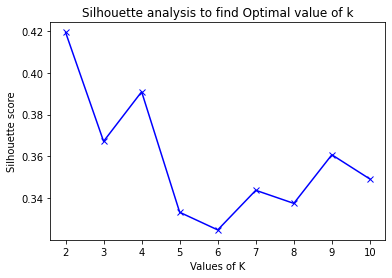

The most optimal value for n_clusters= 2 and the silhouette_score for it is 0.41948052343085984


In [ ]:
#plotting graph for different values of k vs Silhouette score in order to find the most optimal value of k
from sklearn.metrics import silhouette_score
silhouette_scores = []
max_silhouette_score=-1
best_n_clusters=0
k = [2, 3, 4, 5, 6, 7, 8, 9, 10]
for j in k:
 k_means = KMeans(n_clusters=j)
 k_means=k_means.fit(df)
 labels = k_means.labels_
 score=silhouette_score(df,labels)
 silhouette_scores.append(score)
 if(score>max_silhouette_score):
   max_silhouette_score=score
   best_n_clusters=j
 print("silhouette_score for n_clusters=",j,"is",score)

plt.plot(k,silhouette_scores,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis to find Optimal value of k')
plt.show()
print("The most optimal value for n_clusters=",best_n_clusters,"and the silhouette_score for it is",max_silhouette_score)

**The most optimal value for k is 2 because silhouette score is maximimum for k=2 i.e it is more close to 1 than for other vaues of k.
If the silhouette score has a score of 1, it indicates that data points are highly concentrated within their cluster and are situated at a significant distance from other clusters, implying that this is the best scenario.**

## c) There are few methods to find the optimal k value for k-means algorithm like the Elbow Method . Use the above method to find the optimal value of k.

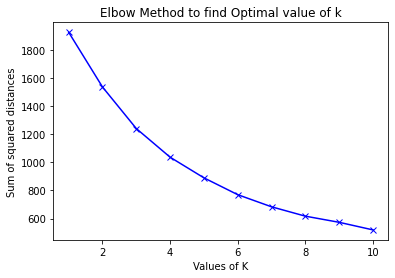

In [ ]:
sum_of_squares = []
k= [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
for i in k :
 k_means = KMeans(n_clusters=i)
 k_means=k_means.fit(df)
 sum_of_squares.append(k_means.inertia_)
plt.plot(k,sum_of_squares,c='blue',marker='x',ls='-')
plt.title('Elbow Method to find Optimal value of k')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances') 
plt.show()

## d) Apply bagging with the KNN classifier as the base model. Show results with different values of K(=1,2,3). Comment on whether the accuracy changes or not after bagging with KNN along with the proper reason in terms of variance and bias.

In [ ]:
x=df
y=y_target


In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=1)
print(x_train.shape[0])
print(x_test.shape[0])

149
65


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier
k=[1,2,3]
for j in k:
     classifier_knn=KNeighborsClassifier(n_neighbors=j)
     classifier_knn=classifier_knn.fit(x_train, y_train)
     training_score_knn=classifier_knn.score(x_train,y_train)
     testing_score_knn=classifier_knn.score(x_test,y_test)
     print("The accuracy score of knn classifier for k=",j,"for training dataset=",training_score_knn)
     print("The accuracy score of knn classifier for k=",j,"for testing dataset=",testing_score_knn)
     classifier_bg= BaggingClassifier(estimator=classifier_knn,n_estimators=10, random_state=0)
     classifier_bg=classifier_bg.fit(x_train, y_train)
     training_score_bagging=classifier_bg.score(x_train,y_train)
     testing_score_bagging=classifier_bg.score(x_test,y_test)
     print("The accuracy score of knn Bagging for k=",j,"for training dataset=",training_score_bagging)
     print("The accuracy score of knn Bagging for k=",j,"for testing dataset=",testing_score_bagging,'\n')

     

The accuracy score of knn classifier for k= 1 for training dataset= 1.0
The accuracy score of knn classifier for k= 1 for testing dataset= 0.7692307692307693
The accuracy score of knn Bagging for k= 1 for training dataset= 0.9798657718120806
The accuracy score of knn Bagging for k= 1 for testing dataset= 0.7538461538461538 

The accuracy score of knn classifier for k= 2 for training dataset= 0.7986577181208053
The accuracy score of knn classifier for k= 2 for testing dataset= 0.7384615384615385
The accuracy score of knn Bagging for k= 2 for training dataset= 0.9328859060402684
The accuracy score of knn Bagging for k= 2 for testing dataset= 0.7230769230769231 

The accuracy score of knn classifier for k= 3 for training dataset= 0.8053691275167785
The accuracy score of knn classifier for k= 3 for testing dataset= 0.7384615384615385
The accuracy score of knn Bagging for k= 3 for training dataset= 0.8389261744966443
The accuracy score of knn Bagging for k= 3 for testing dataset= 0.73846153

# **Question 2:**

In [ ]:
from sklearn.datasets import fetch_olivetti_faces
df=fetch_olivetti_faces()
x=df['data']
y=df['target']

In [ ]:

scaler = StandardScaler()
x= scaler.fit_transform(x)
print(x.shape)
Counter(y)

(400, 4096)


Counter({0: 10,
         1: 10,
         2: 10,
         3: 10,
         4: 10,
         5: 10,
         6: 10,
         7: 10,
         8: 10,
         9: 10,
         10: 10,
         11: 10,
         12: 10,
         13: 10,
         14: 10,
         15: 10,
         16: 10,
         17: 10,
         18: 10,
         19: 10,
         20: 10,
         21: 10,
         22: 10,
         23: 10,
         24: 10,
         25: 10,
         26: 10,
         27: 10,
         28: 10,
         29: 10,
         30: 10,
         31: 10,
         32: 10,
         33: 10,
         34: 10,
         35: 10,
         36: 10,
         37: 10,
         38: 10,
         39: 10})

##  a),b) 



In [ ]:
import math
class k_means:
  def __init__(self,df,k,l,max_iter):
    self.centres=l
    self.datapoints=df
    self.k=k
    self.iter=max_iter


  def eucl(self,x1,x2):
    s=0
    x1=list(x1)
    x2=list(x2)
    for i in range(len(x1)):
      x=x1[i]-x2[i]
      s+=x**2
    return math.sqrt(s)



  def dist(self,points,centre):
    l=[]
    points=list(points)
    for i in range(len(points)):
      l.append(self.eucl(points[i],centre))
    return l
  
  def lis(self,points,centroid_list):
    l2=[]
    for i in range(len(centroid_list)):
      l2.append(self.dist(points,centroid_list[i]))
    return l2
  
  def groups(self):
    list_all=self.lis(self.datapoints,self.centres)
    #print(list_all)
    l=[]
    for i in range(len(list_all[0])):
      m=list_all[0][i]
      index=0
      for j in range(1,len(list_all)):
        if(list_all[j][i]<m):
          m=list_all[j][i]
          index=j
      l.append(index)
    return l

  def centroids(self):
      l=self.groups()
      #print(l)
      count=[0]*len(l)
      new_centroid=[]
      for i in range(self.k):
        new_centroid.append([0]*len(self.datapoints[0]))
      for i in range(len(l)):
        count[l[i]]+=1
        for j in range(len(self.datapoints[0])):
          new_centroid[l[i]][j]+=self.datapoints[i][j]
      for i in range(self.k):
        for j in range(len(new_centroid[0])):
          new_centroid[i][j]=new_centroid[i][j]/count[i]
      return new_centroid,l

  def run(self):
    for i in range(self.iter):
      #print(i)
      centroid_,labels_=self.centroids()
      #print(centroid_,self.centres)
      m=0
      for j in range(self.k):
        for n in range(len(centroid_[j])):
          if(centroid_[j][n]!=self.centres[j][n]):
            m=1
            break
      if(m==0):
        break
      else:
        self.centres=centroid_
    return self.centres,labels_

  def predict(self):
    a,labels=self.run()
    return labels


## c) Train the k-means model on Olivetti data with k = 40 and 10 random 4096 dimensional points (in input range) as initializations. Report the number of points in each cluster.

In [ ]:
import random
input =range(0,len(x))
input_indexes=random.sample(input, 40)
initial_centroids=[]
for j in input_indexes:
  initial_centroids.append(x[j,:])

In [ ]:
model=k_means(x,40,initial_centroids,20)
predicted_labels=model.predict()

In [ ]:
Counter(predicted_labels)

Counter({23: 12,
         30: 6,
         29: 5,
         25: 15,
         12: 19,
         16: 13,
         21: 20,
         19: 12,
         11: 21,
         14: 10,
         20: 23,
         15: 20,
         9: 27,
         31: 8,
         17: 6,
         18: 7,
         5: 22,
         7: 8,
         36: 7,
         39: 18,
         26: 5,
         28: 5,
         10: 7,
         32: 5,
         33: 17,
         38: 4,
         34: 7,
         4: 9,
         24: 4,
         22: 4,
         35: 5,
         8: 5,
         1: 9,
         27: 10,
         0: 3,
         6: 2,
         13: 8,
         3: 5,
         37: 6,
         2: 1})

## d) Visualize the cluster centers of each cluster as 2-d images of all clusters.

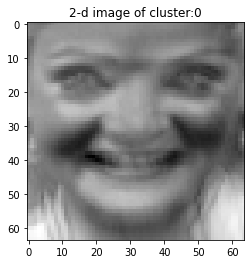

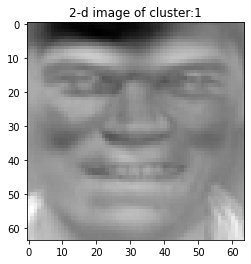

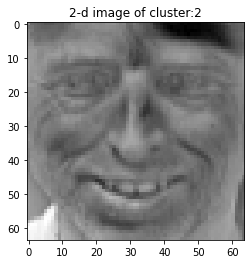

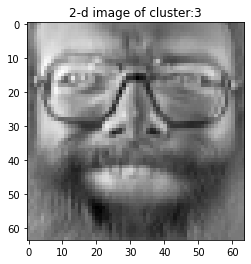

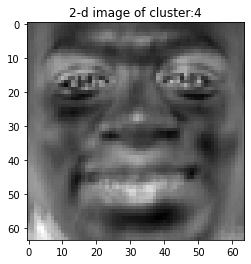

...

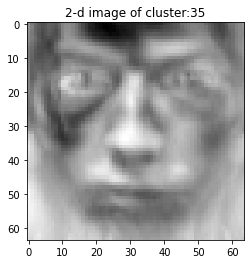

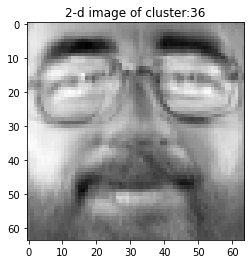

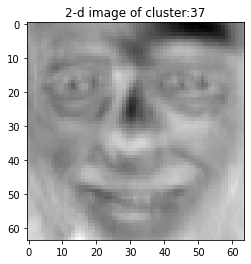

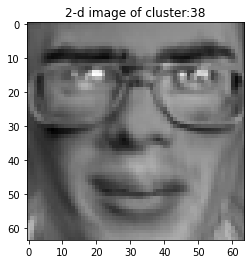

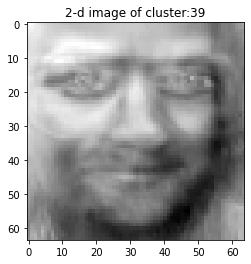

In [ ]:
centers_=np.array(model.centres)
for i in range(len(centers_)):
  reshaped_center=centers_[i].reshape(64,64)
  plt.imshow(reshaped_center,cmap='gray')
  plt.title("2-d image of cluster:"+str(i))
  plt.show()

## e) Visualize 10 images corresponding to each cluster.

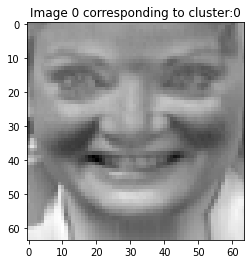

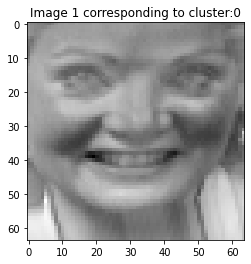

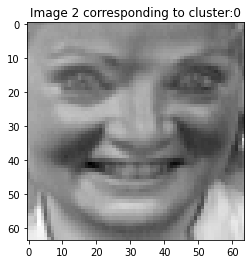

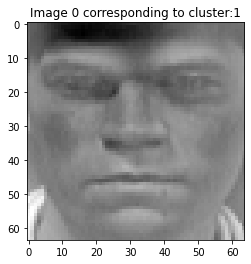

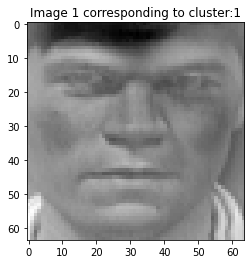

...

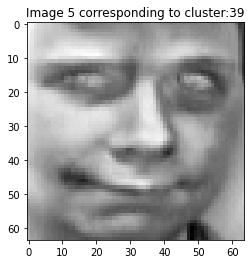

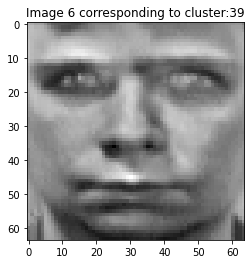

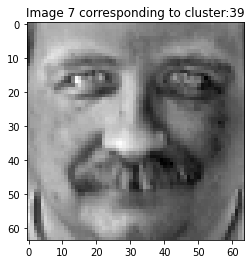

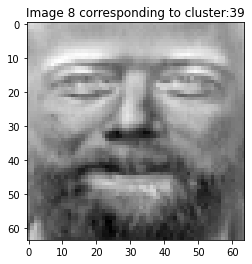

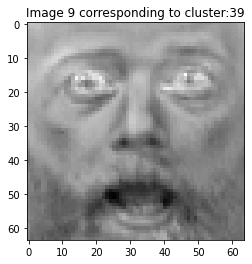

In [ ]:
labels_array=np.array(predicted_labels)
for i in range(model.k):
    indexes=[]
    for j in range(len(labels_array)):
      if(labels_array[j]==i):
        indexes.append(j)
        if(len(indexes)>=10):
          break
    for j in range(len(indexes)):
        data_point=x[indexes[j]].reshape(64,64)
        plt.imshow(data_point,cmap='gray')
        plt.title("Image "+str(j)+" corresponding to cluster:"+str(i))
        plt.show()

## f) Train another k-means model with 10 images from each class as initializations , report the number of points in each cluster and visualize the cluster centers.

In [ ]:
df_centres=[]
for i in range(40):
  df_centres.append(x[i*10,:])

In [ ]:
model_2=k_means(x,40,df_centres,20)
predicted_labels_2=model_2.predict()

In [ ]:
Counter(predicted_labels_2)

Counter({0: 11,
         7: 6,
         37: 24,
         17: 20,
         11: 8,
         1: 10,
         2: 14,
         30: 17,
         4: 19,
         3: 5,
         22: 16,
         14: 6,
         24: 23,
         5: 10,
         6: 7,
         8: 11,
         39: 9,
         9: 3,
         10: 15,
         12: 11,
         13: 10,
         15: 2,
         16: 6,
         18: 5,
         19: 4,
         29: 15,
         21: 10,
         23: 13,
         26: 10,
         27: 10,
         28: 6,
         20: 5,
         31: 10,
         32: 10,
         33: 10,
         34: 3,
         35: 6,
         36: 5,
         25: 5,
         38: 10})

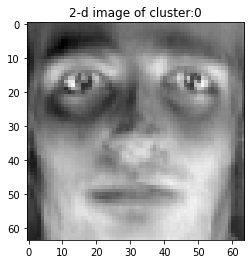

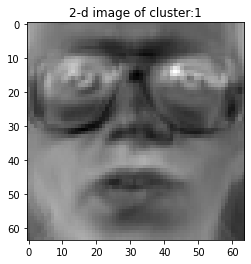

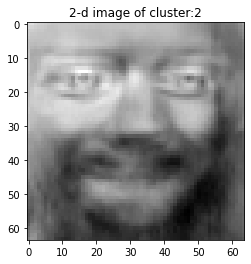

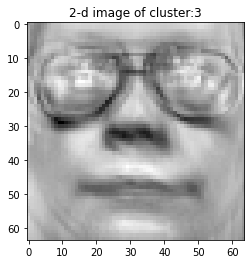

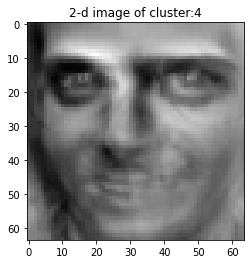

...

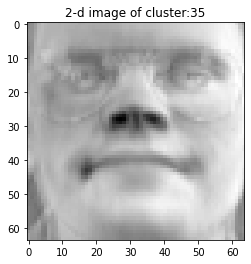

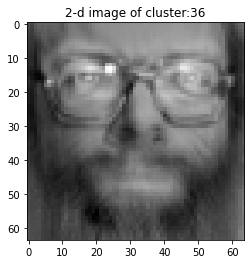

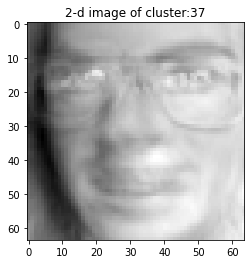

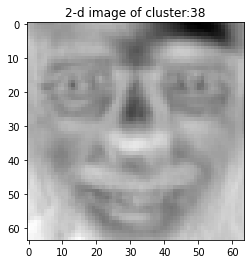

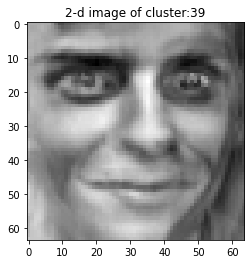

In [ ]:
centers_2=np.array(model_2.centres)
for i in range(len(centers_2)):
  reshaped_center2=centers_2[i].reshape(64,64)
  plt.imshow(reshaped_center2,cmap='gray')
  plt.title("2-d image of cluster:"+str(i))
  plt.show()

##g) Visualize 10 images corresponding to each cluster.

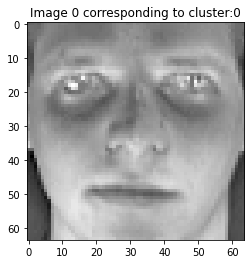

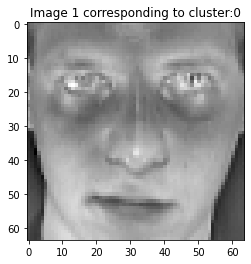

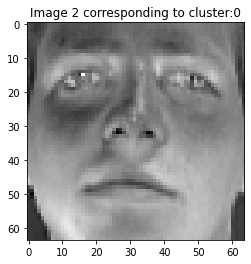

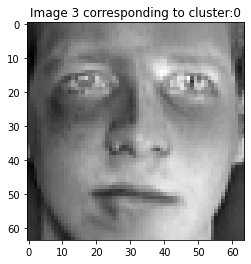

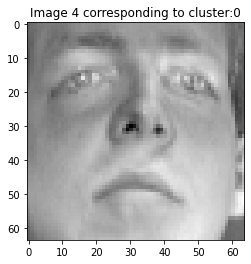

...

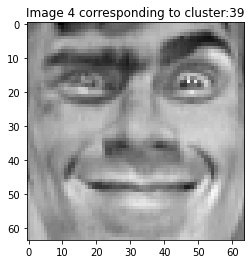

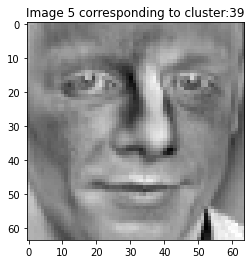

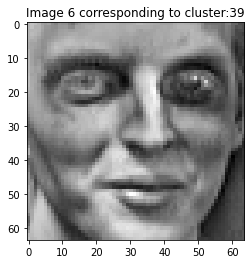

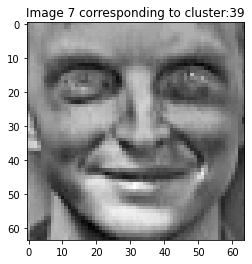

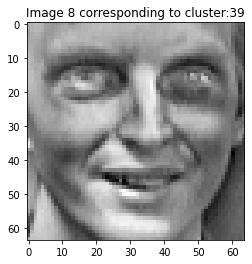

In [ ]:
labels_array_2=np.array(predicted_labels_2)
for i in range(model_2.k):
    indexes=[]
    for j in range(len(labels_array_2)):
      if(labels_array_2[j]==i):
        indexes.append(j)
        if(len(indexes)>=10):
          break
    for j in range(len(indexes)):
        data_point=x[indexes[j]].reshape(64,64)
        plt.imshow(data_point,cmap='gray')
        plt.title("Image "+str(j)+" corresponding to cluster:"+str(i))
        plt.show()

## h) Evaluate Clusters of part c and part f with Sum of Squared Error (SSE) method. Report the scores and comment on which case is a better clustering.

In [ ]:
def eucl(x1,x2):
    s=0
    x1=list(x1)
    x2=list(x2)
    for i in range(len(x1)):
      x=x1[i]-x2[i]
      s+=x**2
    return math.sqrt(s)
def sse(datapoints,labels,centroids):
  sse=0
  for i in range(len(datapoints)):
    c=centroids[labels[i]]
    sse+=eucl(c,datapoints[i])**2
  return sse


In [ ]:
sse_c=sse(x,predicted_labels,model.centres)
print(sse_c)

645164.062986185


In [ ]:
sse_c=sse(x,predicted_labels_2,model_2.centres)
print(sse_c)

618831.4235038817


#**Question 3:**

In [ ]:
df=pd.read_csv('/content/Wholesale customers data.csv')
df

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185
...,...,...,...,...,...,...,...,...
435,1,3,29703,12051,16027,13135,182,2204
436,1,3,39228,1431,764,4510,93,2346
437,2,3,14531,15488,30243,437,14841,1867
438,1,3,10290,1981,2232,1038,168,2125


## A. Check out the dataset & preprocess the data so that the scale of each variable will be the same.

### preprocessing

In [ ]:
print(df.isnull().sum())

Channel             0
Region              0
Fresh               0
Milk                0
Grocery             0
Frozen              0
Detergents_Paper    0
Delicassen          0
dtype: int64


In [ ]:
#now we check the datatype of each attribute
print(df.dtypes)

Channel             int64
Region              int64
Fresh               int64
Milk                int64
Grocery             int64
Frozen              int64
Detergents_Paper    int64
Delicassen          int64
dtype: object


In [ ]:
#we check the distribution of each attribute using describe() method
print(df.describe())

          Channel      Region          Fresh          Milk       Grocery  \
count  440.000000  440.000000     440.000000    440.000000    440.000000   
mean     1.322727    2.543182   12000.297727   5796.265909   7951.277273   
std      0.468052    0.774272   12647.328865   7380.377175   9503.162829   
min      1.000000    1.000000       3.000000     55.000000      3.000000   
25%      1.000000    2.000000    3127.750000   1533.000000   2153.000000   
50%      1.000000    3.000000    8504.000000   3627.000000   4755.500000   
75%      2.000000    3.000000   16933.750000   7190.250000  10655.750000   
max      2.000000    3.000000  112151.000000  73498.000000  92780.000000   

             Frozen  Detergents_Paper    Delicassen  
count    440.000000        440.000000    440.000000  
mean    3071.931818       2881.493182   1524.870455  
std     4854.673333       4767.854448   2820.105937  
min       25.000000          3.000000      3.000000  
25%      742.250000        256.750000    408.

Text(0.5, 1.0, 'Region')

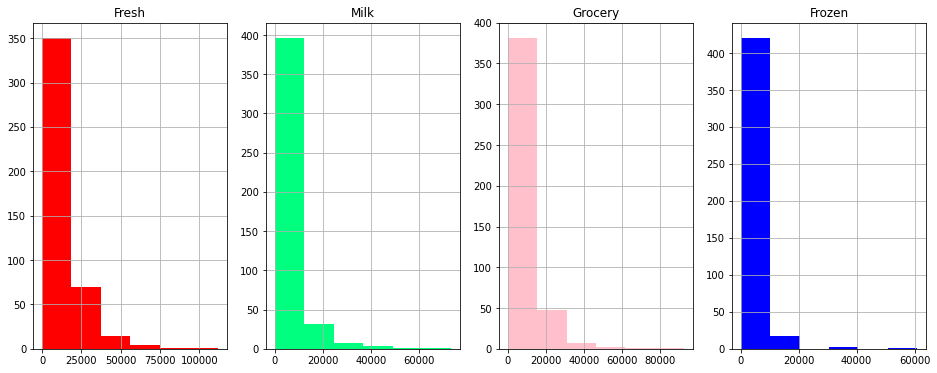

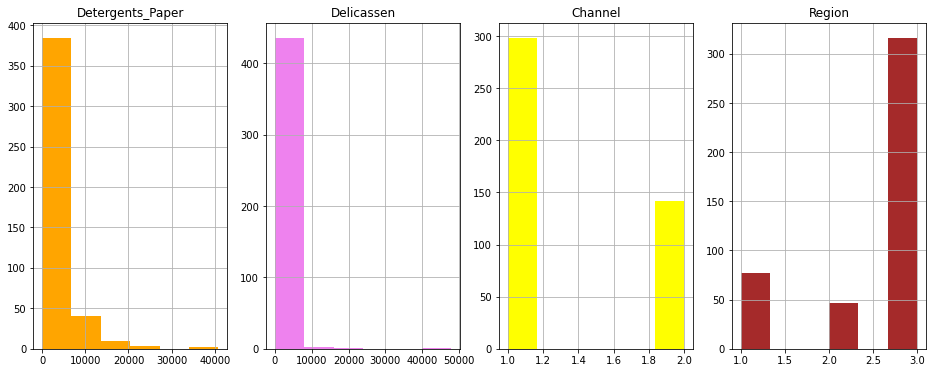

In [ ]:
# visualizing each attribute using histogram
figure, axes = plt.subplots(1, 4, figsize=(16,6))
df['Fresh'].hist(bins=6,ax=axes[0],color='red')
df['Milk'].hist(bins=6,ax=axes[1],color='springgreen')
df['Grocery'].hist(bins=6,ax=axes[2],color='pink')
df['Frozen'].hist(bins=6,ax=axes[3],color='blue')
axes[0].set_title('Fresh')
axes[1].set_title('Milk')
axes[2].set_title('Grocery')
axes[3].set_title('Frozen')
figure, axes = plt.subplots(1, 4, figsize=(16,6))
df['Detergents_Paper'].hist(bins=6,ax=axes[0],color='orange')
df['Delicassen'].hist(bins=6,ax=axes[1],color='violet')
df['Channel'].hist(bins=6,ax=axes[2],color='yellow')
df['Region'].hist(bins=6,ax=axes[3],color='brown')
axes[0].set_title('Detergents_Paper')
axes[1].set_title('Delicassen')
axes[2].set_title('Channel')
axes[3].set_title('Region')

In [ ]:
#now we do standardization of attributes so that scale of each variable will be the same.
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df.iloc[:,:]=scaler.fit_transform(df.iloc[:,:])
df

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,1.448652,0.590668,0.052933,0.523568,-0.041115,-0.589367,-0.043569,-0.066339
1,1.448652,0.590668,-0.391302,0.544458,0.170318,-0.270136,0.086407,0.089151
2,1.448652,0.590668,-0.447029,0.408538,-0.028157,-0.137536,0.133232,2.243293
3,-0.690297,0.590668,0.100111,-0.624020,-0.392977,0.687144,-0.498588,0.093411
4,1.448652,0.590668,0.840239,-0.052396,-0.079356,0.173859,-0.231918,1.299347
...,...,...,...,...,...,...,...,...
435,-0.690297,0.590668,1.401312,0.848446,0.850760,2.075222,-0.566831,0.241091
436,-0.690297,0.590668,2.155293,-0.592142,-0.757165,0.296561,-0.585519,0.291501
437,1.448652,0.590668,0.200326,1.314671,2.348386,-0.543380,2.511218,0.121456
438,-0.690297,0.590668,-0.135384,-0.517536,-0.602514,-0.419441,-0.569770,0.213046


## B. Find out the covariance between the pair of features with which you can best visualize the outliers. Also, visualize the same set of features.

In [ ]:
#now we find the covariance matrix which includes the covariances between each pair of features.
data=df.copy()
data=data.T #we need to take transpose such that covariance matrix computes covariances column wise
covariance_matrix=np.cov(data)
print(covariance_matrix)
print(covariance_matrix.shape)

[[ 1.0022779   0.06216891 -0.1695574   0.46176975  0.61017902 -0.2025062
   0.63747517  0.05613902]
 [ 0.06216891  1.0022779   0.05541286  0.03236105  0.00771331 -0.02109215
  -0.00148606  0.0453151 ]
 [-0.1695574   0.05541286  1.0022779   0.10073872 -0.01188088  0.34666934
  -0.10218518  0.24524735]
 [ 0.46176975  0.03236105  0.10073872  1.0022779   0.7299942   0.1242762
   0.66332323  0.40729398]
 [ 0.61017902  0.00771331 -0.01188088  0.7299942   1.0022779  -0.04028429
   0.92674693  0.20596461]
 [-0.2025062  -0.02109215  0.34666934  0.1242762  -0.04028429  1.0022779
  -0.13182451  0.39183801]
 [ 0.63747517 -0.00148606 -0.10218518  0.66332323  0.92674693 -0.13182451
   1.0022779   0.06944914]
 [ 0.05613902  0.0453151   0.24524735  0.40729398  0.20596461  0.39183801
   0.06944914  1.0022779 ]]
(8, 8)


In [ ]:
#we can identify the pair of features that can best visualize the outliers by finding out the pair which has maximum covariance.
def best_features(df,cov_mat):
  covaraince_maximum=0
  feature_1_index=0
  feature_2_index=0
  for i in range(len(data)):
      for j in range(i+1,len(data)):
          if cov_mat[i][j] > covaraince_maximum:
              covaraince_maximum =cov_mat[i][j]
              feature_1_index=i
              feature_2_index=j
  return covaraince_maximum,feature_1_index,feature_2_index
covariance_matrix.shape
covariance_max,feature1,feature2=best_features(df,covariance_matrix)
print("Features with highest covariance",df.columns[feature1],"and", df.columns[feature2],"and they have covariance=",covariance_max)

Features with highest covariance Grocery and Detergents_Paper and they have covariance= 0.9267469338858263


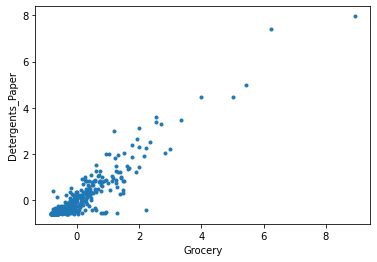

In [ ]:
plt.scatter(df['Grocery'], df['Detergents_Paper'], s=9)
plt.xlabel('Grocery')
plt.ylabel('Detergents_Paper')
plt.show()

## C. Apply DBSCAN to cluster the data points and visualize the same.

In [ ]:
from sklearn.cluster import DBSCAN
classifier_db = DBSCAN(eps=1, min_samples=5)
db_clustering = classifier_db.fit(df)
target_cluster=classifier_db.labels_

In [ ]:
z=target_cluster.tolist()

In [ ]:
from collections import Counter
print(Counter(target_cluster))

Counter({1: 187, 0: 83, -1: 81, 2: 50, 4: 26, 5: 7, 3: 6})


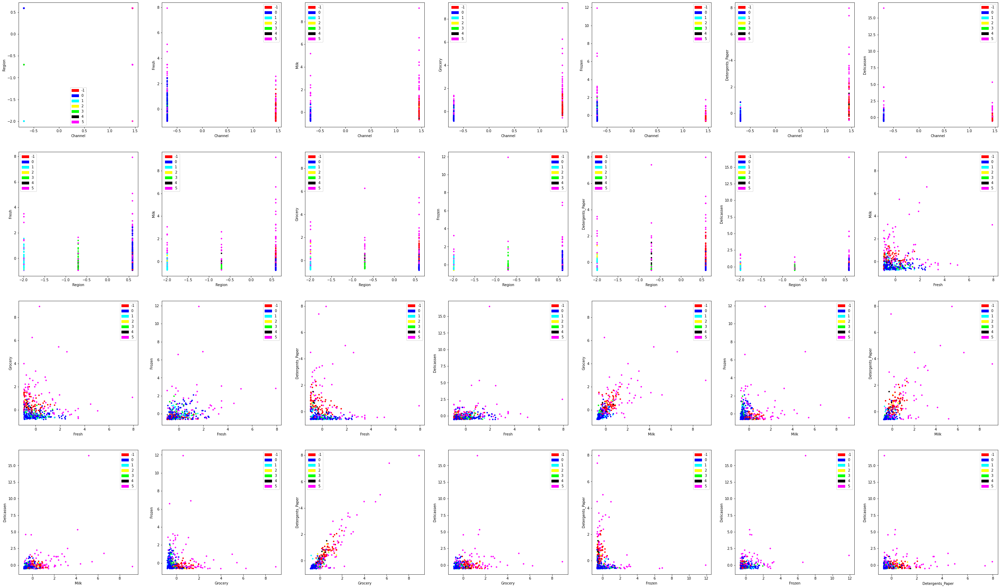

In [ ]:
import matplotlib
import matplotlib.patches as mpatches
patchList = []
r=0
c=0
legend_dict = { '-1' : 'r', '0' : 'blue', '1' : 'cyan','2' : 'yellow', '3' : 'lime', '4' : 'black' ,'5':'magenta'}
for key in legend_dict:
              data_key = mpatches.Patch(color=legend_dict[key], label=key)
              patchList.append(data_key)
colormap = np.array(['r', 'blue', 'cyan','yellow','lime','black','magenta'])
fig, axs = plt.subplots(4, 7,figsize=(50, 30))
for i in range(8):
  for j in range(i+1,8):
      axs[r,c].scatter(df.iloc[:,i], df.iloc[:,j], s=10,c=colormap[target_cluster],cmap=matplotlib.colors.ListedColormap(colormap))
      axs[r,c].set_xlabel(df.columns[i])
      axs[r,c].set_ylabel(df.columns[j])
      axs[r,c].legend(handles=patchList)
      
      c+=1
      if(c==7):
        r+=1
        c=0

## D. Apply KNN on the same dataset and compare the visualization with DBSCAN. Comment on what you observe with reason in the report.

In [ ]:
from sklearn.cluster import KMeans
k_means = KMeans(n_clusters=3, random_state=0)
label = k_means.fit_predict(df)

In [ ]:
label

array([0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1,
       1, 2, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 2, 0, 0, 1, 1, 0, 0, 1, 1, 2, 0, 1, 1, 0, 2, 0, 0, 1, 2,
       1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 2, 2, 1,
       1, 1, 1, 1, 2, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 2, 1, 1, 0, 1, 0, 1, 0, 1,
       1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0,

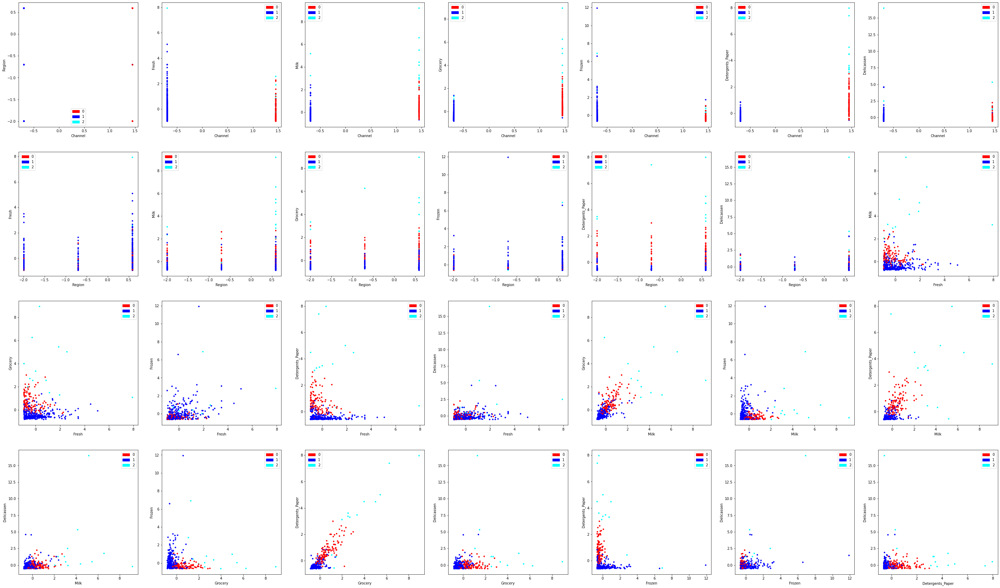

In [ ]:
import matplotlib
import matplotlib.patches as mpatches
patchList = []
r=0
c=0
legend_dict = { '0' : 'r', '1' : 'blue', '2' : 'cyan'}
for key in legend_dict:
              data_key = mpatches.Patch(color=legend_dict[key], label=key)
              patchList.append(data_key)
colormap = np.array(['r', 'blue', 'cyan'])
fig, axs = plt.subplots(4, 7,figsize=(50, 30))
for i in range(8):
  for j in range(i+1,8):
      axs[r,c].scatter(df.iloc[:,i], df.iloc[:,j], s=10,c=colormap[label],cmap=matplotlib.colors.ListedColormap(colormap))
      axs[r,c].set_xlabel(df.columns[i])
      axs[r,c].set_ylabel(df.columns[j])
      axs[r,c].legend(handles=patchList)
      
      c+=1
      if(c==7):
        r+=1
        c=0

##E. Use the make_moons function of sklearn to create a datasat of 2000 points. Add some noise to the plot, i.e., randomly add data points to the plot with a 20% probability. Apply DBSCAN and KNN to cluster them and finally compare the plots and comment on which one is better.

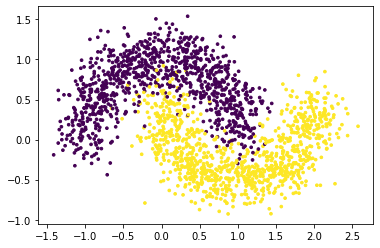

In [ ]:
from sklearn.datasets import make_moons
x,y=make_moons(n_samples=2000,noise=0.2)
plt.scatter(x[:, 0], x[:, 1], c=y,s=7)
plt.show()


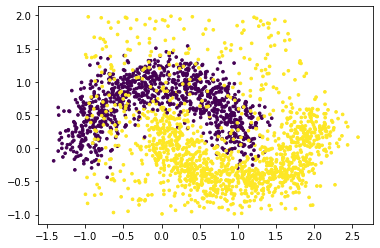

In [ ]:
add_noise= np.random.choice([True, False], size=x.shape[0], p=[0.2, 0.8])
noise=np.random.uniform(low=-1, high=2, size=(len(x[add_noise]),2))
x = np.concatenate([x, noise])
y = np.concatenate([y, np.ones(np.sum(add_noise))])
plt.scatter(x[:, 0], x[:, 1], c=y,s=7)
plt.show()

In [ ]:
from sklearn.cluster import DBSCAN
classifier_db = DBSCAN(eps=0.1, min_samples=5)
db_clustering = classifier_db.fit(x)
target_cluster=classifier_db.labels_

In [ ]:
Counter(target_cluster)

Counter({0: 2196,
         -1: 168,
         1: 5,
         2: 5,
         4: 5,
         5: 5,
         3: 8,
         8: 3,
         6: 6,
         7: 8,
         10: 5,
         9: 7})

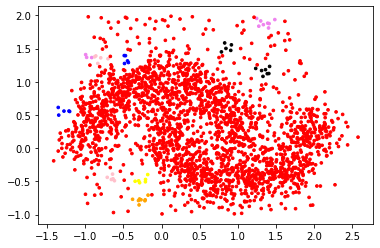

In [ ]:
plt.scatter(x[:,0],x[:,1],s=7,c=target_cluster,cmap=matplotlib.colors.ListedColormap(np.array(['red','blue','orange','pink','yellow','violet','black'])))
plt.show() 

In [ ]:
from sklearn.cluster import KMeans
k_means = KMeans(n_clusters=3, random_state=0)
label = k_means.fit_predict(x)

In [ ]:
label

array([0, 1, 2, ..., 0, 2, 1], dtype=int32)

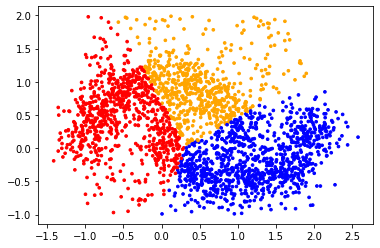

In [ ]:
plt.scatter(x[:,0],x[:,1],s=7,c=label,cmap=matplotlib.colors.ListedColormap(np.array(['red','blue','orange'])))
plt.show() 